In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In this HW, you will implement a CycleGAN for selfie-to-anime and anime-to-selfie unpaired translations. You can read more about CycleGANs [here](https://machinelearningmastery.com/what-is-cyclegan/).

You are to create and train your CycleGAN on the provided dataset. After training, show 10 selfie-to-anime and and anime-to-selfie from the test set. Also, you show you models performance on three random images from internet for both modes. You can also use your own selfie if you want.

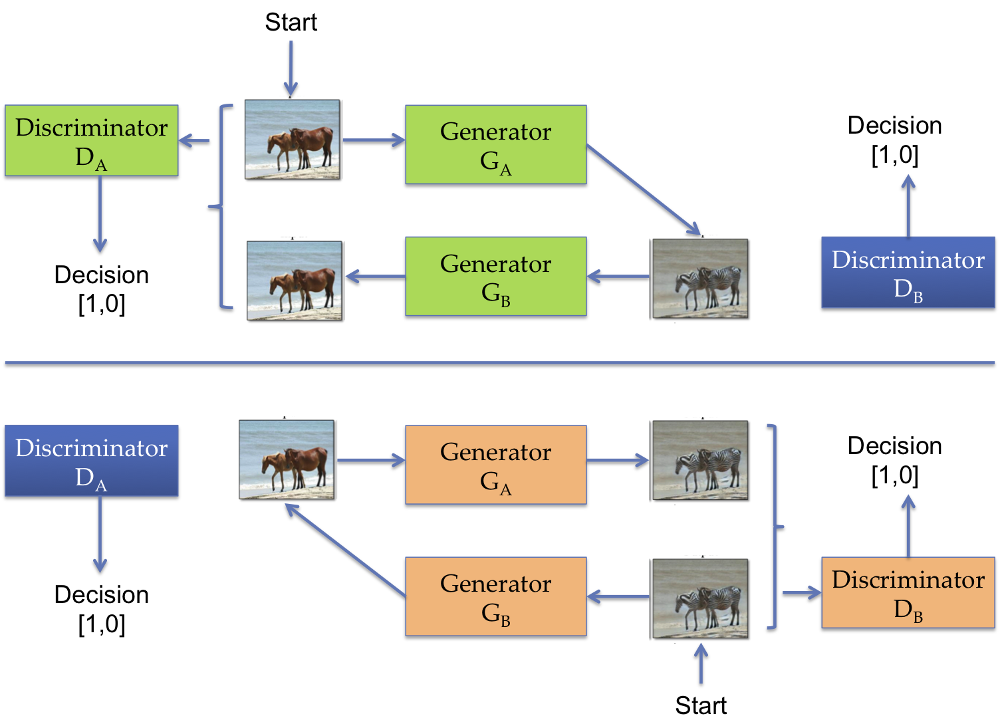

# import libs

In [ ]:
!pip install torchinfo
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import torch
import torchvision
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import models, datasets, transforms
import copy
import cv2
from PIL import Image
import os
import seaborn as sns
from torch.utils.data import Dataset, DataLoader
from tqdm import tqdm
from IPython.display import clear_output
from torchinfo import summary
from torchvision.utils import make_grid
import requests
from io import BytesIO
import random

clear_output()

[Image Source](https://www.oreilly.com/library/view/hands-on-artificial-intelligence/9781788836067/c2e7d914-4e45-4528-8627-c590d19107ef.xhtml)

# Data Handling

## Download Data

In [ ]:
!gdown "1xOWj1UVgp6NKMT3HbPhBbtq2A4EDkghF"

Downloading...
From (original): https://drive.google.com/uc?id=1xOWj1UVgp6NKMT3HbPhBbtq2A4EDkghF
From (redirected): https://drive.google.com/uc?id=1xOWj1UVgp6NKMT3HbPhBbtq2A4EDkghF&confirm=t&uuid=a30099fd-ed16-4431-b1ec-dabda45577c5
To: /content/selfie2anime.zip
100% 409M/409M [00:13<00:00, 29.4MB/s]


In [ ]:
!unzip selfie2anime.zip
clear_output()

## Data pre processing

In [ ]:
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

class CustomDataset(Dataset):
  def __init__(self, split="train", split_type="A"):
    super().__init__()
    self.data = []
    self.root_dir = "/content/" + split + split_type
  def __len__(self):
    return len(os.listdir(self.root_dir))

  def __getitem__(self, index):
    img_path = os.path.join(self.root_dir, os.listdir(self.root_dir)[index])
    img = Image.open(img_path)
    return transform(img)

train_real_dataset = CustomDataset(split="train", split_type="A")
train_anime_dataset = CustomDataset(split="train", split_type="B")
test_real_dataset = CustomDataset(split="test", split_type="A")
test_anime_dataset = CustomDataset(split="test", split_type="B")

batch_size = 16

train_real_dataloader = DataLoader(train_real_dataset, batch_size=batch_size, shuffle=True)
train_anime_dataloader = DataLoader(train_anime_dataset, batch_size=batch_size, shuffle=True)

test_real_dataloader = DataLoader(test_real_dataset, batch_size=batch_size, shuffle=True)
test_anime_dataloader = DataLoader(test_anime_dataset, batch_size=batch_size, shuffle=True)

In [ ]:
for i in train_real_dataloader: # just to make sure of sizes (I am not bothered by other data loaders because I will face issues anyway)
  if (i.shape != torch.Size([batch_size, 3, 256, 256])):
    print(i.shape)
    break


torch.Size([8, 3, 256, 256])


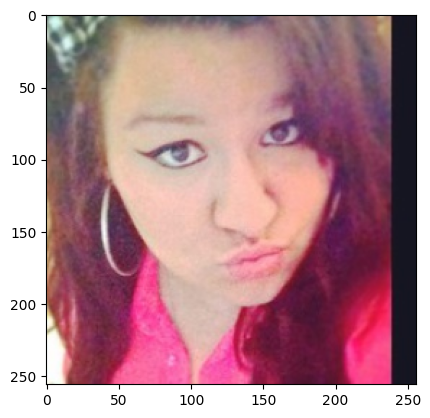

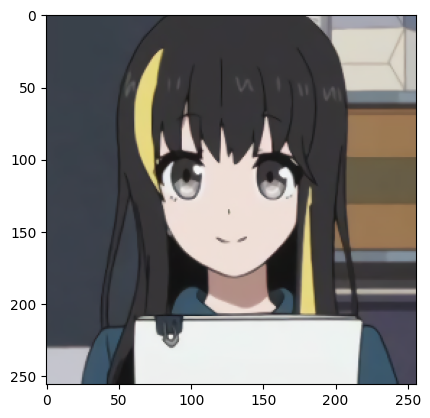

In [ ]:
# display an image from the dataset
def show_image(img):
    img = img / 2 + 0.5     # unnormalize
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()
# display the pair
show_image(train_real_dataset[0])
show_image(train_anime_dataset[0])

# Model

## Model Archeticture
I originally used a similar generator as I did in pix2pix, but the results are terrible so I added residual blocks. For the discriminaor I am again using PatchGAN.

### Generator

#### OLD

In [ ]:
class Generator(nn.Module):
  def __init__(self):
    super().__init__()
    # enc
    self.conv1 = nn.Conv2d(3, 64, 4, 2, 1) # 128 x 128
    self.conv2 = nn.Conv2d(64, 128, 4, 2, 1) # 64 x 64
    self.conv3 = nn.Conv2d(128, 256, 4, 2, 1) # 32 x 32
    self.conv4 = nn.Conv2d(256, 512, 4, 2, 1) # 16 x 16
    self.conv5 = nn.Conv2d(512, 512, 4, 2, 1) # 8 x 8
    self.conv6 = nn.Conv2d(512, 512, 4, 2, 1) # 4 x 4
    self.conv7 = nn.Conv2d(512, 512, 4, 2, 1) # 2 x 2
    self.conv8 = nn.Conv2d(512, 512, 3, 2, 1) # 2 x 2
    # dec
    self.dec1 = nn.ConvTranspose2d(512, 512, 4, stride=2, padding=1)
    self.dec2 = nn.ConvTranspose2d(512 * 2, 512, 4, stride=2, padding=1)
    self.dec3 = nn.ConvTranspose2d(512 * 2, 512, 4, stride=2, padding=1)
    self.dec4 = nn.ConvTranspose2d(512 * 2, 512, 4, stride=2, padding=1)
    self.dec5 = nn.ConvTranspose2d(512 * 2, 256, 4, stride=2, padding=1)
    self.dec6 = nn.ConvTranspose2d(256 * 2, 128, 4, stride=2, padding=1)
    self.dec7 = nn.ConvTranspose2d(128 * 2, 64, 4, stride=2, padding=1)
    self.dec8 = nn.ConvTranspose2d(64 * 2, 3, 4, stride=2, padding=1)
    # activation
    self.relu = nn.LeakyReLU()
    self.tanh = nn.Tanh()

    # Instance norms
    self.in64 = nn.InstanceNorm2d(64)
    self.in128 = nn.InstanceNorm2d(128)
    self.in256 = nn.InstanceNorm2d(256)
    self.in512 = nn.InstanceNorm2d(512)

    # Dropout
    self.dropout = nn.Dropout(0.5)

  # forward
  def forward(self, x):
    # enc
    enc1 = self.relu(self.in64(self.conv1(x)))
    enc2 = self.relu(self.in128(self.conv2(enc1)))
    enc3 = self.relu(self.in256(self.conv3(enc2)))
    enc4 = self.dropout(self.relu(self.in512(self.conv4(enc3))))
    enc5 = self.dropout(self.relu(self.in512(self.conv5(enc4))))
    enc6 = self.dropout(self.relu(self.in512(self.conv6(enc5))))
    enc7 = self.dropout(self.relu(self.in512(self.conv7(enc6))))
    enc8 = self.relu(self.conv8(enc7))
    # print("", enc8.shape)
    # dec
    x = self.dropout(self.relu(self.in512(self.dec1(enc8))))
    x = torch.cat([x, enc7], dim=1)
    x = self.dropout(self.relu(self.in512(self.dec2(x))))
    x = torch.cat([x, enc6], dim=1)
    x = self.dropout(self.relu(self.in512(self.dec3(x))))
    x = torch.cat([x, enc5], dim=1)
    x = self.dropout(self.relu(self.in512(self.dec4(x))))
    x = torch.cat([x, enc4], dim=1)
    x = self.relu(self.in256(self.dec5(x)))
    x = torch.cat([x, enc3], dim=1)
    x = self.relu(self.in128(self.dec6(x)))
    x = torch.cat([x, enc2], dim=1)
    x = self.relu(self.in64(self.dec7(x)))
    x = torch.cat([x, enc1], dim=1)
    x = self.tanh(self.dec8(x))
    return x

#### NEW

In [ ]:
class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super(ResidualBlock, self).__init__()
        self.conv1 = nn.Conv2d(channels, channels, kernel_size=3, padding=1, bias=False)
        self.in1 = nn.InstanceNorm2d(channels)
        self.conv2 = nn.Conv2d(channels, channels, kernel_size=3, padding=1, bias=False)
        self.in2 = nn.InstanceNorm2d(channels)
        self.relu = nn.ReLU(inplace=True)

    def forward(self, x):
        residual = x
        out = self.relu(self.in1(self.conv1(x)))
        out = self.in2(self.conv2(out))
        out += residual
        return self.relu(out)

class EncoderBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=3, stride=2, padding=1, apply_instancenorm=True):
        super(EncoderBlock, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding, bias=False)
        self.instancenorm = nn.InstanceNorm2d(out_channels) if apply_instancenorm else nn.Identity()
        self.relu = nn.ReLU(inplace=True)

    def forward(self, x):
        x = self.conv(x)
        x = self.instancenorm(x)
        x = self.relu(x)
        return x

class DecoderBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=3, stride=2, padding=1, output_padding=1):
        super(DecoderBlock, self).__init__()
        self.conv_transpose = nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding, output_padding, bias=False)
        self.instancenorm = nn.InstanceNorm2d(out_channels)
        self.relu = nn.ReLU(inplace=True)

    def forward(self, x):
        x = self.conv_transpose(x)
        x = self.instancenorm(x)
        x = self.relu(x)
        return x

class Generator(nn.Module):
    def __init__(self, input_channels=3, output_channels=3, num_residual_blocks=3):
        super(Generator, self).__init__()

        # Encoder
        self.enc1 = EncoderBlock(input_channels, 64, kernel_size=7, stride=1, padding=3, apply_instancenorm=False)
        self.enc2 = EncoderBlock(64, 128)
        self.enc3 = EncoderBlock(128, 256)

        # Residual blocks
        self.res_blocks = nn.Sequential(*[ResidualBlock(256) for _ in range(num_residual_blocks)])

        # Decoder
        self.dec1 = DecoderBlock(512, 128)  # 512 due to skip connection
        self.dec2 = DecoderBlock(256, 64)   # 256 due to skip connection

        # Output layer
        self.output_conv = nn.Conv2d(128, output_channels, kernel_size=7, stride=1, padding=3, bias=False)
        self.tanh = nn.Tanh()

    def forward(self, x):
        # Encoder
        e1 = self.enc1(x)
        e2 = self.enc2(e1)
        e3 = self.enc3(e2)

        # Residual blocks
        x = self.res_blocks(e3)

        # Decoder with skip connections
        x = torch.cat([x, e3], dim=1)
        x = self.dec1(x)
        x = torch.cat([x, e2], dim=1)
        x = self.dec2(x)
        x = torch.cat([x, e1], dim=1)

        # Output
        x = self.output_conv(x)
        x = self.tanh(x)

        return x

In [ ]:
summary(Generator(), (1, 3, 256, 256))

Layer (type:depth-idx)                   Output Shape              Param #
Generator                                [1, 3, 256, 256]          --
├─EncoderBlock: 1-1                      [1, 64, 256, 256]         --
│    └─Conv2d: 2-1                       [1, 64, 256, 256]         9,408
│    └─Identity: 2-2                     [1, 64, 256, 256]         --
│    └─ReLU: 2-3                         [1, 64, 256, 256]         --
├─EncoderBlock: 1-2                      [1, 128, 128, 128]        --
│    └─Conv2d: 2-4                       [1, 128, 128, 128]        73,728
│    └─InstanceNorm2d: 2-5               [1, 128, 128, 128]        --
│    └─ReLU: 2-6                         [1, 128, 128, 128]        --
├─EncoderBlock: 1-3                      [1, 256, 64, 64]          --
│    └─Conv2d: 2-7                       [1, 256, 64, 64]          294,912
│    └─InstanceNorm2d: 2-8               [1, 256, 64, 64]          --
│    └─ReLU: 2-9                         [1, 256, 64, 64]          --
├─S

### Discriminator

In [ ]:
class Discriminator(nn.Module):
  def __init__(self, input_channels = 3):
    super(Discriminator, self).__init__()
    self.discriminator = nn.Sequential(
        nn.Conv2d(input_channels, 8, 3, 1, 1),
        nn.LeakyReLU(0.2, inplace=True),
        nn.Conv2d(8, 16, 4, 2, 1),
        nn.LeakyReLU(0.2, inplace=True),
        nn.BatchNorm2d(16),
        nn.Conv2d(16, 32, 3, 1, 1),
        nn.BatchNorm2d(32),
        nn.LeakyReLU(0.2, inplace=True),
        nn.Conv2d(32, 64, 3, 1, 1),
        nn.BatchNorm2d(64),
        nn.LeakyReLU(0.2, inplace=True),
        nn.Conv2d(64, 32, 4, 2, 1),
        nn.BatchNorm2d(32),
        nn.LeakyReLU(0.2, inplace=True),
        nn.Conv2d(32, 16, 3, 1, 1),
        nn.BatchNorm2d(16),
        nn.LeakyReLU(0.2, inplace=True),
        nn.Conv2d(16, 8, 3, 1, 1),
        nn.BatchNorm2d(8),
        nn.LeakyReLU(0.2, inplace=True),
        nn.Conv2d(8, 1, 4, 2, 1),
    )
  def forward(self, x):
    return self.discriminator(x)

In [ ]:
summary(Discriminator(), (1, 3, 256, 256))

Layer (type:depth-idx)                   Output Shape              Param #
Discriminator                            [1, 1, 32, 32]            --
├─Sequential: 1-1                        [1, 1, 32, 32]            --
│    └─Conv2d: 2-1                       [1, 8, 256, 256]          224
│    └─LeakyReLU: 2-2                    [1, 8, 256, 256]          --
│    └─Conv2d: 2-3                       [1, 16, 128, 128]         2,064
│    └─LeakyReLU: 2-4                    [1, 16, 128, 128]         --
│    └─BatchNorm2d: 2-5                  [1, 16, 128, 128]         32
│    └─Conv2d: 2-6                       [1, 32, 128, 128]         4,640
│    └─BatchNorm2d: 2-7                  [1, 32, 128, 128]         64
│    └─LeakyReLU: 2-8                    [1, 32, 128, 128]         --
│    └─Conv2d: 2-9                       [1, 64, 128, 128]         18,496
│    └─BatchNorm2d: 2-10                 [1, 64, 128, 128]         128
│    └─LeakyReLU: 2-11                   [1, 64, 128, 128]         --
│  

## Sanity check

In [ ]:
## free gpu memory
torch.cuda.empty_cache()

In [ ]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
generator_anime = Generator().to(device)
generator_selfie = Generator().to(device)
discriminator_anime = Discriminator().to(device)
discriminator_selfie = Discriminator().to(device)

batch = next(iter(train_real_dataloader)).to(device)
# check genrators
generator_real_outputs = generator_anime(batch)
generator_anime_outputs = generator_selfie(batch)
# check discrminators
discriminator_real_outputs = discriminator_selfie(batch)
discriminator_anime_outputs = discriminator_anime(batch)

print(generator_real_outputs.shape, generator_anime_outputs.shape)
print(discriminator_real_outputs.shape, discriminator_anime_outputs.shape)

torch.Size([16, 3, 256, 256]) torch.Size([16, 3, 256, 256])
torch.Size([16, 1, 32, 32]) torch.Size([16, 1, 32, 32])


## Training

In [ ]:
# Helper functions
def save_images(original_imgs, generated_imgs, epoch, output_dir):
    # Create the output directory if it doesn't exist
    os.makedirs(output_dir, exist_ok=True)

    # Create a figure with two rows and 10 columns
    fig, axes = plt.subplots(2, 10, figsize=(20, 5))

    original_imgs = [(img + 1) / 2 for img in original_imgs]
    original_imgs = np.transpose(original_imgs, (0, 2, 3, 1))
    generated_imgs = [(img + 1) / 2 for img in generated_imgs]
    generated_imgs = np.transpose(generated_imgs, (0, 2, 3, 1))

    # Display real images in the first row
    for i, img in enumerate(original_imgs):
        axes[0, i].imshow(img)
        axes[0, i].axis('off')  # Hide the axes for cleaner display

    # Display generated images in the second row
    for i, img in enumerate(generated_imgs):
        axes[1, i].imshow(img)
        axes[1, i].axis('off')  # Hide the axes for cleaner display

    # Add titles for each row
    axes[0, 4].set_title('Original Image', fontsize=20, pad=10)
    axes[1, 4].set_title('Generated Images by Model', fontsize=20, pad=10)

    plt.tight_layout()
    plt.savefig(f'{output_dir}/epoch_{epoch}.jpg')
    plt.close()

def save_models(generator_irl, generator_anime, discriminator_irl, discriminator_anime, epoch, output_dir):
    os.makedirs(output_dir, exist_ok=True)
    torch.save(generator_irl.state_dict(), f"{output_dir}/generator_real_epoch_{epoch}.pth")
    torch.save(generator_anime.state_dict(), f"{output_dir}/generator_anime_epoch_{epoch}.pth")
    torch.save(discriminator_irl.state_dict(), f"{output_dir}/discriminator_real_epoch_{epoch}.pth")
    torch.save(discriminator_anime.state_dict(), f"{output_dir}/discriminator_anime_epoch_{epoch}.pth")

In [ ]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
num_epochs = 35
beta1 = 0.5
beta2 = 0.999
betas = (beta1, beta2)
# optimizers
optimizer_g_anime = optim.Adam(generator_anime.parameters(), lr=0.002, betas=betas)
optimizer_g_selfie = optim.Adam(generator_selfie.parameters(), lr=0.002, betas=betas)

optimizer_d_anime = optim.Adam(discriminator_anime.parameters(), lr=0.0007, betas=betas)
optimizer_d_selfie = optim.Adam(discriminator_selfie.parameters(), lr=0.0007, betas=betas)

# schedulars
scheduler_g_selfie = optim.lr_scheduler.CosineAnnealingLR(optimizer_g_selfie, T_max=num_epochs)
scheduler_g_anime = optim.lr_scheduler.CosineAnnealingLR(optimizer_g_anime, T_max=num_epochs)
scheduler_d_selfie = optim.lr_scheduler.CosineAnnealingLR(optimizer_d_selfie, T_max=num_epochs)
scheduler_d_anime = optim.lr_scheduler.CosineAnnealingLR(optimizer_d_anime, T_max=num_epochs)

# losses
loss_fn = nn.BCEWithLogitsLoss()
loss_l1 = nn.L1Loss()


In [ ]:
from random import sample
random_indexes = sample(range(len(train_real_dataset)), 10)
displayed_train_irl_sample = [train_real_dataset[i] for i in random_indexes]
displayed_train_anime_sample = [train_anime_dataset[i] for i in random_indexes]

In [ ]:
######## I already ran it for 35 epochs ########
for i in range(35, num_epochs+36):
    pbar = tqdm(zip(train_real_dataloader, train_anime_dataloader))
    generator_anime.train()
    generator_selfie.train()
    discriminator_anime.train()
    discriminator_selfie.train()
    for b, data in enumerate(pbar):
        selfie, anime = data
        selfie = selfie.to(device)
        anime = anime.to(device)

        # Train Discriminators
        optimizer_d_selfie.zero_grad()
        optimizer_d_anime.zero_grad()

        # Real images
        d_selfie_real = discriminator_selfie(selfie)
        d_anime_real = discriminator_anime(anime)
        d_selfie_real_loss = loss_fn(d_selfie_real, torch.ones_like(d_selfie_real))
        d_anime_real_loss = loss_fn(d_anime_real, torch.ones_like(d_anime_real))

        # Fake images
        anime_fake = generator_anime(selfie)
        selfie_fake = generator_selfie(anime)
        d_selfie_fake = discriminator_selfie(selfie_fake.detach())
        d_anime_fake = discriminator_anime(anime_fake.detach())
        d_selfie_fake_loss = loss_fn(d_selfie_fake, torch.zeros_like(d_selfie_fake))
        d_anime_fake_loss = loss_fn(d_anime_fake, torch.zeros_like(d_anime_fake))

        # Total discriminator losses
        d_selfie_loss = d_selfie_real_loss + d_selfie_fake_loss
        d_anime_loss = d_anime_real_loss + d_anime_fake_loss

        d_selfie_loss.backward()
        d_anime_loss.backward()

        optimizer_d_selfie.step()
        optimizer_d_anime.step()

        # Train Generators
        optimizer_g_selfie.zero_grad()
        optimizer_g_anime.zero_grad()

        # Adversarial loss
        d_selfie_fake = discriminator_selfie(selfie_fake)
        d_anime_fake = discriminator_anime(anime_fake)
        g_selfie_adv_loss = loss_fn(d_selfie_fake, torch.ones_like(d_selfie_fake))
        g_anime_adv_loss = loss_fn(d_anime_fake, torch.ones_like(d_anime_fake))

        # Cycle consistency loss
        selfie_recovered = generator_selfie(anime_fake)
        anime_recovered = generator_anime(selfie_fake)
        cycle_selfie_loss = loss_l1(selfie, selfie_recovered)
        cycle_anime_loss = loss_l1(anime, anime_recovered)

        # Identity loss (I have added this)
        identity_selfie_loss = loss_l1(selfie, generator_selfie(selfie))
        identity_anime_loss = loss_l1(anime, generator_anime(anime))

        # Total generator losses
        lambda_cycle = 10.0
        lambda_identity = 0.5 * lambda_cycle
        g_selfie_loss = g_selfie_adv_loss + lambda_cycle * cycle_selfie_loss + lambda_identity * identity_selfie_loss
        g_anime_loss = g_anime_adv_loss + lambda_cycle * cycle_anime_loss + lambda_identity * identity_anime_loss

        g_loss = g_selfie_loss + g_anime_loss

        g_loss = g_selfie_loss + g_anime_loss
        g_loss.backward()

        optimizer_g_selfie.step()
        optimizer_g_anime.step()

        pbar.set_description(f"Epoch {i}/{num_epochs+36}")
        pbar.set_postfix({
            "D_selfie_loss": d_selfie_loss.item(),
            "D_anime_loss": d_anime_loss.item(),
            "G_selfie_loss": g_selfie_loss.item(),
            "G_anime_loss": g_anime_loss.item()
        })

    scheduler_g_selfie.step()
    scheduler_g_anime.step()
    scheduler_d_selfie.step()
    scheduler_d_anime.step()

    # save sample images
    with torch.no_grad():
        real_anime = torch.stack(displayed_train_anime_sample).to(device)
        fake_selfie = generator_selfie(real_anime).cpu().detach().numpy()
        save_images(displayed_train_anime_sample, fake_selfie, i, "/content/drive/MyDrive/HW4/generated_images/anime2selfie_imgs")

        real_selfie = torch.stack(displayed_train_irl_sample).to(device)
        fake_anime = generator_anime(real_selfie).cpu().detach().numpy()
        save_images(displayed_train_irl_sample, fake_anime, i, "/content/drive/MyDrive/HW4/generated_images/selfie2anime_imgs")

    # save model
    save_models(generator_selfie, generator_anime, discriminator_selfie, discriminator_anime, i, "/content/drive/MyDrive/HW4/models")

Epoch 35/71: : 213it [02:11,  1.61it/s, D_selfie_loss=1.58, D_anime_loss=1.13, G_selfie_loss=1.68, G_anime_loss=2.06]
Epoch 36/71: : 213it [02:12,  1.61it/s, D_selfie_loss=1.04, D_anime_loss=1.12, G_selfie_loss=1.69, G_anime_loss=2.26]
Epoch 37/71: : 213it [02:12,  1.61it/s, D_selfie_loss=1.03, D_anime_loss=1.3, G_selfie_loss=2.12, G_anime_loss=2.17]
Epoch 38/71: : 213it [02:12,  1.61it/s, D_selfie_loss=1.16, D_anime_loss=1.58, G_selfie_loss=1.77, G_anime_loss=2.05]
Epoch 39/71: : 213it [02:12,  1.61it/s, D_selfie_loss=1.5, D_anime_loss=1.37, G_selfie_loss=1.87, G_anime_loss=2.1]
Epoch 40/71: : 213it [02:12,  1.61it/s, D_selfie_loss=1.9, D_anime_loss=1.63, G_selfie_loss=1.4, G_anime_loss=2.19]
Epoch 41/71: : 213it [02:12,  1.61it/s, D_selfie_loss=1.54, D_anime_loss=1.18, G_selfie_loss=1.99, G_anime_loss=2.42]
Epoch 42/71: : 213it [02:11,  1.61it/s, D_selfie_loss=1.22, D_anime_loss=1.41, G_selfie_loss=2.13, G_anime_loss=2.34]
Epoch 43/71: : 213it [02:12,  1.61it/s, D_selfie_loss=1.4, D_

# Evaluation

In [55]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
selfie_to_anime_generator = Generator().to(device)
anime_to_selfie_generator = Generator().to(device)
selfie_to_anime.load_state_dict(torch.load('/content/drive/MyDrive/HW4/models/generator_anime_epoch_52.pth'))
anime_to_selfie.load_state_dict(torch.load('/content/drive/MyDrive/HW4/models/generator_real_epoch_47.pth'))
anime_to_selfie_generator.train()
selfie_to_anime_generator.train()
print("")


## example of the best results

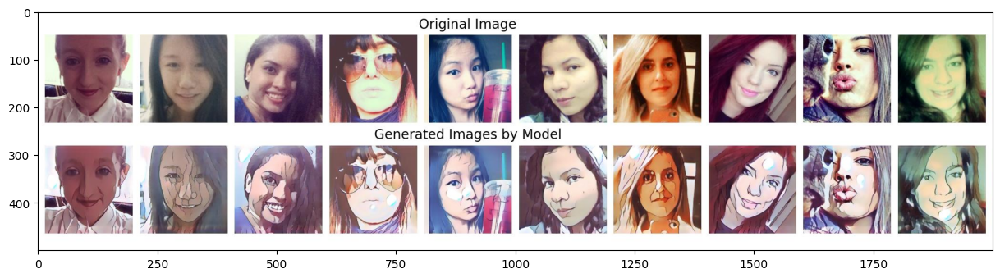

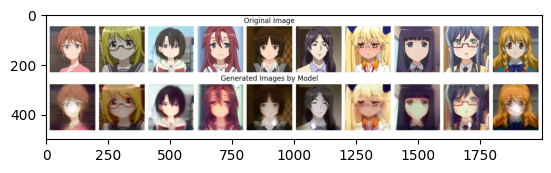

In [57]:
# show selfie to anime
img = Image.open("/content/drive/MyDrive/HW4/generated_images/selfie2anime_imgs/epoch_52.jpg")
img = transforms.ToTensor()(img)

npimg = img.numpy()
plt.figure(figsize=(15, 15))
plt.imshow(np.transpose(npimg, (1, 2, 0)))
plt.show()
# show anime to selfie
img = Image.open("/content/drive/MyDrive/HW4/generated_images/anime2selfie_imgs/epoch_47.jpg")
img = transforms.ToTensor()(img)

npimg = img.numpy()
plt.imshow(np.transpose(npimg, (1, 2, 0)))
plt.show()


## Random pictures from the test dataset

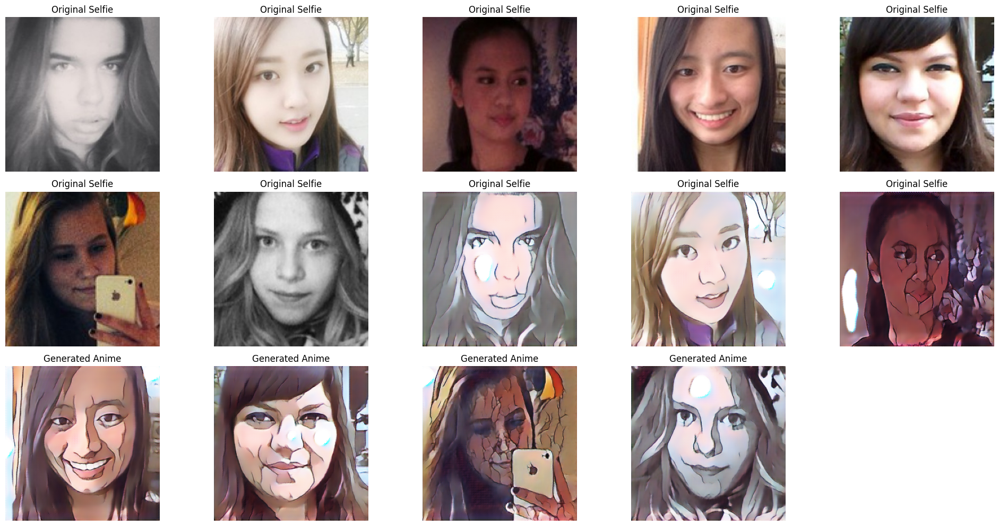

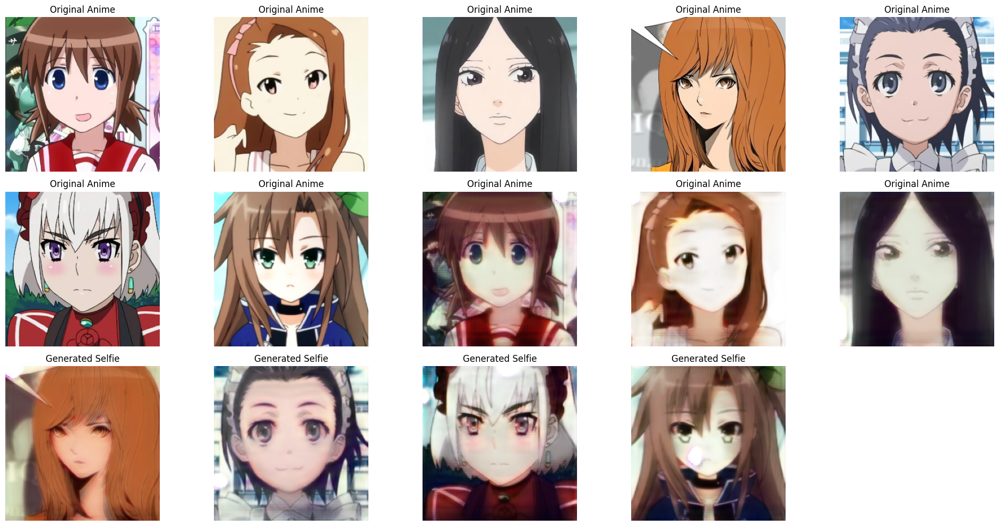

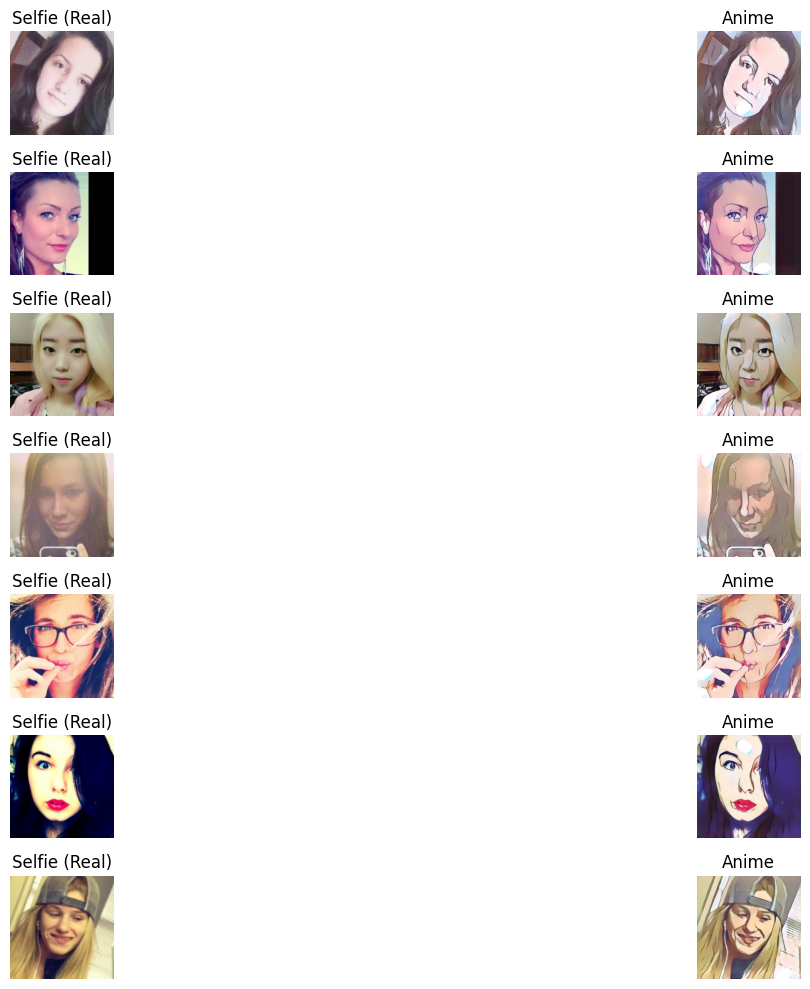

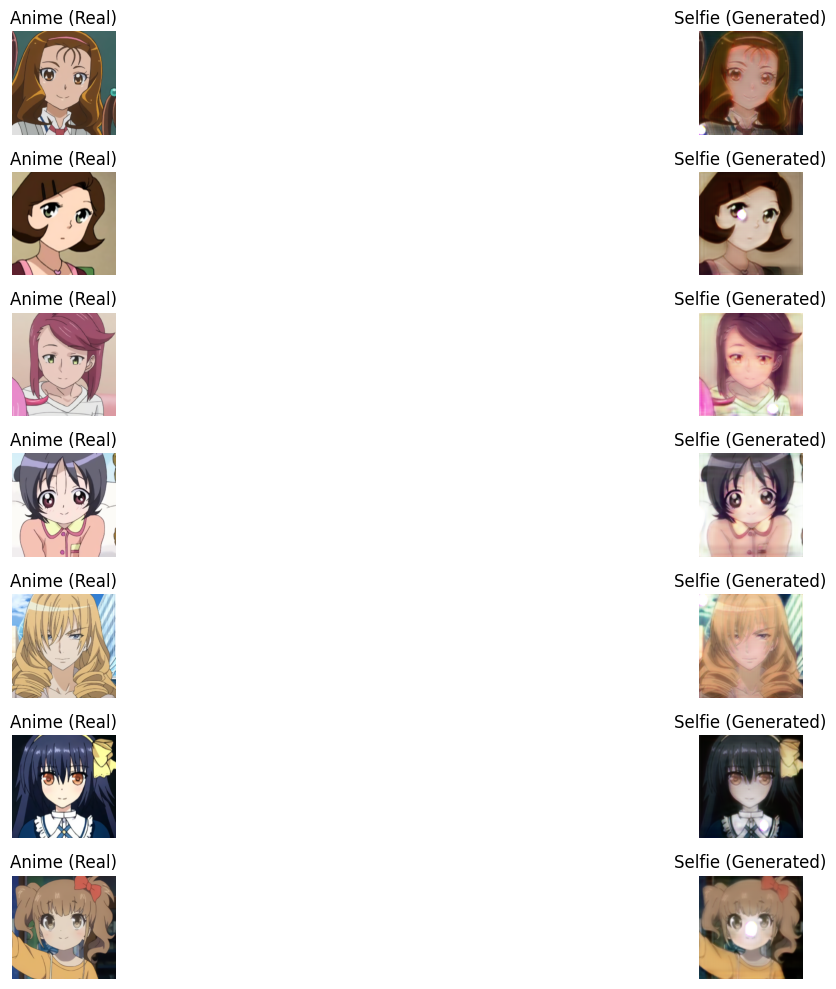

In [64]:
def tensor_to_pil(tensor):
    return transforms.ToPILImage()(tensor.cpu().clone().squeeze(0))

def show_image_pairs(real_images, generated_images, titles=None, figsize=(20, 10)):
    num_pairs = len(real_images)
    fig, axs = plt.subplots(num_pairs, 2, figsize=figsize)

    for i in range(num_pairs):
        # Show real image on the left
        axs[i, 0].imshow(real_images[i])
        axs[i, 0].axis('off')
        if titles:
            axs[i, 0].set_title(titles[i] + " (Real)")

        # Show generated image on the right
        axs[i, 1].imshow(generated_images[i])
        axs[i, 1].axis('off')
        if titles:
            axs[i, 1].set_title( "Anime" if titles[i] == "Selfie" else "Selfie" + " (Generated)")

    plt.tight_layout()
    plt.show()

def generate_results(model, images):
    with torch.no_grad():
        return [tensor_to_pil((model(img.unsqueeze(0).to(device)) * 0.5 + 0.5).clamp(0, 1))
                for img in images]

def evaluate_test_set(real_dataloader, anime_dataloader, num_samples=10):
    real_samples = []
    anime_samples = []

    for i, (real_batch, anime_batch) in enumerate(zip(real_dataloader, anime_dataloader)):
        if i >= num_samples:
            break
        real_samples.append(real_batch[0])  # Assuming the dataloader returns a batch
        anime_samples.append(anime_batch[0])

    generated_animes = generate_results(selfie_to_anime, real_samples)
    generated_selfies = generate_results(anime_to_selfie, anime_samples)

    real_samples = [tensor_to_pil((img * 0.5 + 0.5).clamp(0, 1)) for img in real_samples]
    anime_samples = [tensor_to_pil((img * 0.5 + 0.5).clamp(0, 1)) for img in anime_samples]

    # Show real selfies with their corresponding generated anime images
    show_image_pairs(real_samples, generated_animes, titles=['Selfie']*num_samples)
    # Show real anime images with their corresponding generated selfies
    show_image_pairs(anime_samples, generated_selfies, titles=['Anime']*num_samples)

# Call the function with your dataloaders
evaluate_test_set(test_real_dataloader, test_anime_dataloader)

### Random 3 images (3 selfies, 3 anime) from the internet

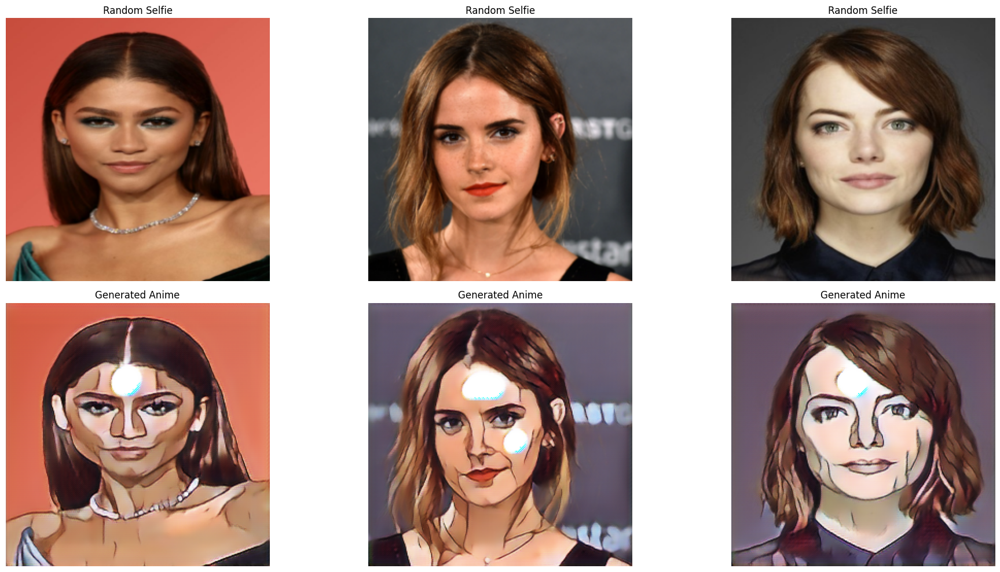

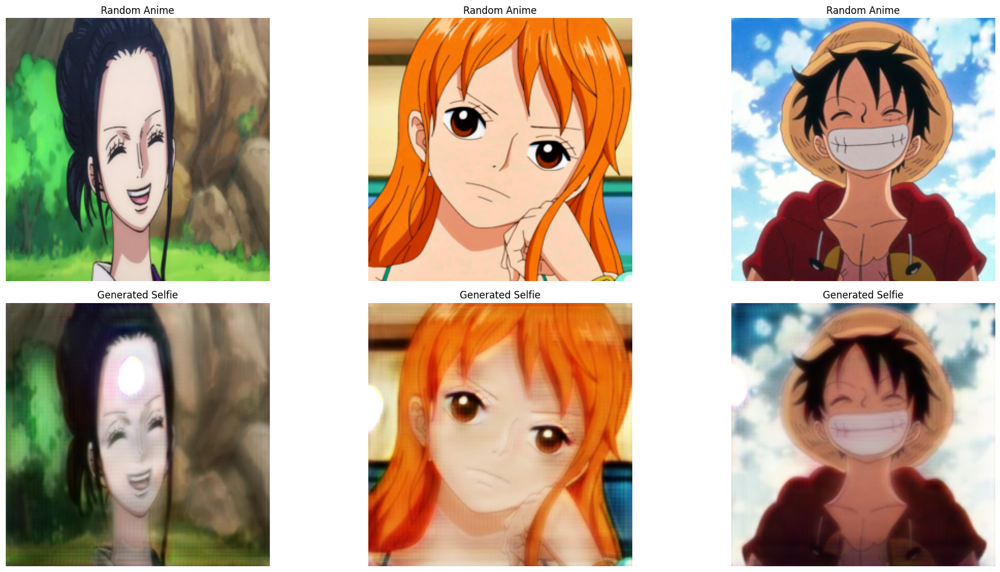

In [66]:
def download_image(url):
    response = requests.get(url)
    img = Image.open(BytesIO(response.content)).convert('RGB')
    transform = transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
    ])
    return transform(img)


random_selfie_urls = [
    'https://goldenglobes.com/wp-content/uploads/2023/10/Zendaya-GettyImages-1401833833.jpg?w=600?w=600',
    'https://static.wikia.nocookie.net/littlewomen/images/a/ac/Emmawatson.png/revision/latest?cb=20191221175400',
    'https://images.mubicdn.net/images/cast_member/51060/cache-2852-1482873231/image-w856.jpg?size=300x'
]

random_anime_urls = [
    'https://static1.cbrimages.com/wordpress/wp-content/uploads/2024/06/robin-smiling-in-wano-1.png',
    'https://static.wikia.nocookie.net/fairypirates/images/d/dd/Nami.png/revision/latest?cb=20161022095010',
    'https://qph.cf2.quoracdn.net/main-qimg-361a57949c4d05e40dced7ee79e67a6e'
]

random_selfies = [download_image(url) for url in random_selfie_urls]
random_animes = [download_image(url) for url in random_anime_urls]

generated_random_animes = generate_results(selfie_to_anime, random_selfies)
generated_random_selfies = generate_results(anime_to_selfie, random_animes)

show_images([tensor_to_pil((img * 0.5 + 0.5).clamp(0, 1)) for img in random_selfies] + generated_random_animes,
            ['Random Selfie']*3 + ['Generated Anime']*3, cols=3)
show_images([tensor_to_pil((img * 0.5 + 0.5).clamp(0, 1)) for img in random_animes] + generated_random_selfies,
            ['Random Anime']*3 + ['Generated Selfie']*3, cols=3)

# Discussion

In this task I used 2 generators and 2 discrimnators. In the beginning I used the same generator and discriminator as the ones I did in the previous task (pix2pix). However, the results were very bad but then I relized that instance normlazation is better than batch normlazation and I got better results but they were not that good. The last improvment I did for the generator is that I added residual blocks which significanlty improved the results. Moreover, I originally used cycle GAN loss and Adversiral GAN loss for each generator, but then I discovered that I can add identity loss to the generator which improved the results because identity loss encourages the generator to preserve the input image when it's already in the target domain.
